In [40]:
import json
import os
import warnings

import folium
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import numpy as np
import obspy
import tensorflow as tf
from obspy.taup import TauPyModel
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

from EqT_utils import FeedForward, f1

warnings.filterwarnings('ignore')

## Create Function

In [153]:
def get_distance_model(deg=5, source_depth=100, plot_blind_test=False):
    poly = PolynomialFeatures(degree=deg, include_bias=True)

    fig, ax = plt.subplots(figsize=(8,5))
    ax.set_title('Phase Travel Times')
    phase = ['P', 'S']
    ax = obspy.taup.plot_travel_times(
        source_depth=source_depth, 
        ax=ax, fig=fig,
        phase_list=phase)
        
    x = ax.lines[0].get_xdata()
    travel_times = {'P': [], 'S': []}
    for i,ph in enumerate(phase):
        lines = ax.lines[i*3].get_data()
        for i in range(len(lines[0])):
            travel_times[ph].append([lines[0][i],lines[1][i]])

    travel_times['P'] = np.array(travel_times['P'])
    travel_times['S'] = np.array(travel_times['S'])

    
    tt_models = []
    val = {'true': [], 'pred': [], 'x':[]}
    for ph in phase:
        poly_reg_model = LinearRegression()
        x, y = travel_times[ph][:,0], travel_times[ph][:,1]
        poly_feat = poly.fit_transform(x.reshape(-1,1))
        poly_model = poly_reg_model.fit(poly_feat, y)
        tt_models.append(poly_model)
        y_pred = poly_model.predict(poly_feat)
        val['x'].append(x)
        val['true'].append(y)
        val['pred'].append(y_pred)

    yp = tt_models[0].predict(poly_feat)
    ys = tt_models[1].predict(poly_feat)

    dt = ys-yp
    dt_poly_feat = poly.fit_transform(dt.reshape(-1,1))
    distance_model = LinearRegression()
    distance_model.fit(dt_poly_feat, x)
    x_pred = distance_model.predict(dt_poly_feat)

    if plot_blind_test:
        fig2, ax2 = plt.subplots(1, figsize=(8,5))
        for i in range(2):
            ax2.plot(val['x'][i], val['true'][i], f'C{i*2}x', markersize=5, label=f"{phase[i]}")
            ax2.plot(val['x'][i], val['pred'][i], 'k--', label=f"{phase[i]} Prediction")
            ax2.set_xlim(0,180)
        
        ax2.plot(x, dt, 'yx', markersize=5, label="P-S")
        ax2.plot(x_pred, dt, 'k--', label="P-S Prediction")
        ax2.set_xlim(0,180)
        ax2.set_xlabel('Distance (degrees)')
        ax2.set_ylabel('Time (minutes)')
        ax2.grid()
        ax2.legend()
    
    return poly, distance_model

def make_stream(dataset):
    '''
    input: hdf5 dataset
    output: obspy stream

    '''
    data = np.array(dataset)

    tr_E = obspy.Trace(data=data[:, 0])
    tr_E.stats.starttime = obspy.UTCDateTime(dataset.attrs['trace_start_time'])
    tr_E.stats.delta = 0.01
    tr_E.stats.channel = dataset.attrs['receiver_type']+'E'
    tr_E.stats.station = dataset.attrs['receiver_code']
    tr_E.stats.network = dataset.attrs['network_code']

    tr_N = obspy.Trace(data=data[:, 1])
    tr_N.stats.starttime = obspy.UTCDateTime(dataset.attrs['trace_start_time'])
    tr_N.stats.delta = 0.01
    tr_N.stats.channel = dataset.attrs['receiver_type']+'N'
    tr_N.stats.station = dataset.attrs['receiver_code']
    tr_N.stats.network = dataset.attrs['network_code']

    tr_Z = obspy.Trace(data=data[:, 2])
    tr_Z.stats.starttime = obspy.UTCDateTime(dataset.attrs['trace_start_time'])
    tr_Z.stats.delta = 0.01
    tr_Z.stats.channel = dataset.attrs['receiver_type']+'Z'
    tr_Z.stats.station = dataset.attrs['receiver_code']
    tr_Z.stats.network = dataset.attrs['network_code']

    stream = obspy.Stream([tr_E, tr_N, tr_Z])

    return stream

def convert_attrs(attrs):
    for key, val in zip(attrs.keys(), attrs.values()):
        if type(val) == np.float32 or type(val) == np.float64:
            attrs[key] = float(val)
        elif type(val) == np.int64:
            attrs[key] = int(val)
        elif type(val) == np.ndarray:
            attrs[key] = val.tolist()
        else:
            attrs[key] = val

    return attrs    

def plot_stream(dset, p, s, eq, 
                is_test=False, pick_thres=.3, eq_thres=.6, 
                figsize=None, title='', hide_eq=True, tr=None):
  fig, ax = plt.subplots(4 if is_test else 3,1, figsize=(figsize))
  plt.tight_layout()

  for i in range(3):
    ymin, ymax = ax[i].get_ylim()
    xtr = ax[i].get_xaxis_transform()  
    ax[i].plot(np.array(dset)[:,i], 'k')
    is_hdf5 = hasattr(dset, 'attrs')
    if is_hdf5:
        ax[i].vlines(dset.attrs['p_arrival_sample'], ymin, ymax, color='b', transform=xtr, label='P-arrival')
        ax[i].vlines(dset.attrs['s_arrival_sample'], ymin, ymax, color='r', transform=xtr, label='S-arrival')
        ax[i].vlines(dset.attrs['coda_end_sample'], ymin, ymax, color='aqua', transform=xtr, label='Coda End')
    
    if tr and not is_hdf5:
        md = df_meta[df_meta['Station']==tr.stats.station]
        pa, sa = md['P Arrival'].values[0], md['S Arrival'].values[0]
        sr = tr.stats.sampling_rate
        pa, sa = int(pa*sr/md['Sampling Rate']), int(sa*sr/md['Sampling Rate'])
        ax[i].axvline(pa, ymin=.1, ymax=.9, c='b', label='P_arrival')
        ax[i].axvline(sa, ymin=.1, ymax=.9, c='r', label='S_arrival')
        
    ax[i].set_xticklabels([])
    ax[i].set_ylabel('Amplitude')
    plt.tight_layout()
    if i==0:
      ax[i].set_title(title)

  if is_test:
    p_p,s_p,eq_p = p.copy(), s.copy(), eq.copy()
    p_ = (p_p>pick_thres).cumsum().cumsum() == 1
    p_p[~p_] = 0
    s_ = (s_p>pick_thres).cumsum().cumsum() == 1
    s_p[~s_] = 0
    eq_p[eq_p<eq_thres] = 0

    ax[3].plot(p_p, 'b--', lw=1.5, label='P_arrival')
    ax[3].plot(s_p, 'r--', lw=1.5, label='S_arrival')
    ax[3].set_ylim(0,.3)
    if not hide_eq:
        ax[3].plot(eq_p, 'g--', lw=.5, label='Earthquake')
    ax[3].set_ylabel('Probability')
    plt.legend(loc='lower center', bbox_to_anchor=(0.5, 1.05), ncol=3)
    plt.tight_layout()
    
    plt.show()


## Polynomial Distance Model

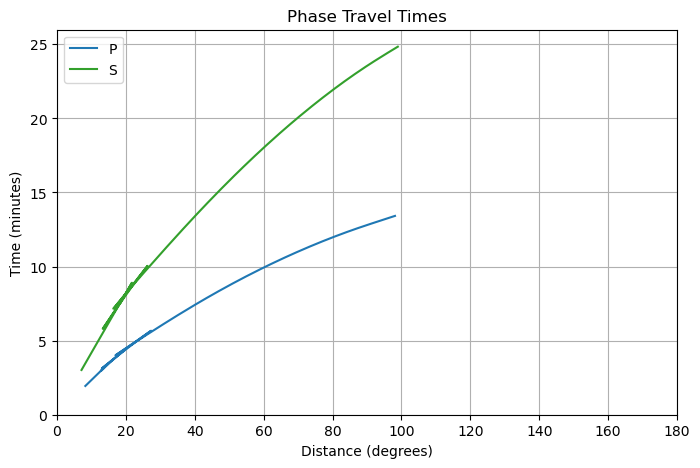

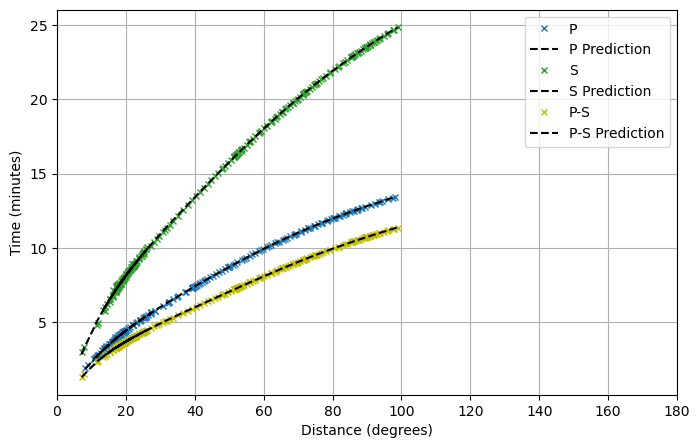

In [42]:
poly, distance_model = get_distance_model(6, plot_blind_test=True)

## Import Event Data

In [43]:
ev_path = '2011-03-11-mw91-near-east-coast-of-honshu-japan-30min.miniseed'
name, extension = os.path.splitext(ev_path)
st = obspy.read(ev_path)
st.merge(method=1)
print(f'{st.count()} traces | {st.count()//3} station' )

54 traces | 18 station


In [44]:
filtered_station = [['INCN','00'], ['INCN','10'], ['MAJO','10'], ['SSE','00'], ['MDJ','00'], ['SSE','10'], ['MDJ','10']]
# filtered_station = []
for fs in filtered_station:
    stf = st.select(station=fs[0], location=fs[1])
    for tr in stf:
        st.remove(tr)

print(f'{st.count()} traces | {st.count()//3} station' )

33 traces | 11 station


In [45]:
import pandas as pd

tp = 60*5 # 5 minutes from first data
ts = 60*30 # 30 minutes from last data

with open('2011-03-11-mw91-near-east-coast-of-honshu-japan-station.json', 'r') as f:
    station_list = json.load(f)

metadata = []
for sta in station_list:
    sst = st.select(station=sta['Station'])
    if sst.count()>0:
        sr = round(sst[0].stats.sampling_rate)
        p_arrival = sr*tp
        s_arrival = sst[0].stats.npts-sr*ts
        
        sta['P Arrival'] = p_arrival
        sta['S Arrival'] = s_arrival
        sta['Sampling Rate'] = sr
        sta['Source Distance'] = None
        sta['Source Distance EQT'] = None
        sta['Source Distance LSTM'] = None
        metadata.append(sta)

df_meta = pd.DataFrame(metadata)

In [46]:
df_meta

,Station,Source,Net,Latitude,Longitude,Distance,Azimuth,Elevation,Station Name,P Arrival,S Arrival,Sampling Rate,Source Distance,Source Distance EQT,Source Distance LSTM
0,ERM,IRISDMC,II,42.015000,143.157200,3.752637,7.504429,40.0,"Erimo, Hokkaido Island, Japan",6000,6900,20,None,None,None
1,MAJO,IRISDMC,IU,36.545670,138.204060,3.832722,-115.856675,405.0,"Matsushiro, Japan",6000,6920,20,None,None,None
2,INU,RESIF,G,35.350000,137.029000,5.275407,-122.277124,132.0,"Inuyama, Japan",6000,7220,20,None,None,None
3,INU,IRISDMC,PS,35.348200,137.028500,5.276786,-122.290468,132.3,"Inuyama, Japan",6000,7220,20,None,None,None
4,YSS,IRISDMC,IU,46.958700,142.760400,8.664537,1.188902,150.0,"Yuzhno Sakhalinsk, Russia",6000,7960,20,None,None,None
5,OGS,IRISDMC,PS,27.057000,142.203000,11.242023,-178.652313,20.0,"Chichijima, Bonin Islands, Japan",6000,8520,20,None,None,None
6,CN2,IRISDMC,CB,43.480000,125.260002,13.991757,-62.792018,223.0,"Changchun,Jilin Province",30000,45501,100,None,None,None
7,SNY,IRISDMC,CB,41.827801,123.578003,14.871195,-70.292310,54.0,"Shenyang,Liaoning Province",30000,46501,100,None,None,None
8,HEH,IRISDMC,CB,50.252998,127.410004,16.053142,-37.004601,165.0,"Heihe,Heilongjiang Province",30000,47801,100,None,None,None
9,DL2,IRISDMC,CB,38.905998,121.627998,16.285905,-81.328249,65.0,"Dalian,Liaoning Province",30000,48101,100,None,None,None


## Test Model

In [158]:
import h5py

# using event station data
station = 'YSS'
test_stream = st.select(station=station).copy()

# using chunk from STEAD
path = '../chunk2.hdf5'
df_c = pd.read_csv('../chunk2.csv')
ev_list = df_c['trace_name'].to_list()
TIMESTEPS = 6000
h5 = h5py.File(path, 'r')
dset = h5.get('data/'+str(ev_list[-1]))
# test_stream = make_stream(dset)

y_ = np.zeros((TIMESTEPS,))
time_p = dset.attrs['p_arrival_sample'].astype(int)
y_[time_p] = 1.0
label_p = y_.astype(int)

y_ = np.zeros((TIMESTEPS,))
y_[dset.attrs['s_arrival_sample'].astype(int)] = 1.0
label_s = y_.astype(int)
    
y_ = np.zeros((TIMESTEPS,))
y_[time_p:dset.attrs['coda_end_sample'][0][0].astype(int)+1] = 1.0
label_eq = y_.astype(int)

label_p = np.expand_dims(label_p, axis=-1)
label_s = np.expand_dims(label_s, axis=-1)
label_eq = np.expand_dims(label_eq, axis=-1)
data = []
for tr in test_stream:
    data.append(tr.data)

data = np.array(data).T
test_stream

3 Trace(s) in Stream:
IU.YSS.00.BHE | 2011-03-11T05:43:27.010645Z - 2011-03-11T06:20:04.960645Z | 20.0 Hz, 43960 samples
IU.YSS.00.BHN | 2011-03-11T05:43:27.010645Z - 2011-03-11T06:20:04.960645Z | 20.0 Hz, 43960 samples
IU.YSS.00.BHZ | 2011-03-11T05:43:27.010645Z - 2011-03-11T06:20:04.960645Z | 20.0 Hz, 43960 samples

### EQTransformer

In [159]:
from keras_self_attention import SeqSelfAttention

custom_objects = {
    'SeqSelfAttention': SeqSelfAttention,
    'FeedForward': FeedForward,
    'f1':f1
    }
selected_model = 'eqt_cnn1_lstm1_bs32_outputs'
model_path = f'../../eqt_models/{selected_model}/final_model.h5'

model_eqt = tf.keras.models.load_model(model_path, custom_objects=custom_objects)
print(model_eqt.summary())

TIMESTEPS = 6000

batch = []
for i in range(data.shape[0]//TIMESTEPS):
    batch.append(data[i*TIMESTEPS:(i+1)*TIMESTEPS])
batch = np.array(batch)
data_ = data[:batch[:,:,0].flatten().shape[0]]

eq_pred, p_pred, s_pred = model_eqt.predict(batch)
eq_pred_eqt = np.squeeze(eq_pred, axis=2).flatten()
p_pred_eqt = np.squeeze(p_pred, axis=2).flatten()
s_pred_eqt = np.squeeze(s_pred, axis=2).flatten()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 6000, 3)]    0           []                               
                                                                                                  
 conv1d (Conv1D)                (None, 6000, 8)      272         ['input[0][0]']                  
                                                                                                  
 max_pooling1d (MaxPooling1D)   (None, 3000, 8)      0           ['conv1d[0][0]']                 
                                                                                                  
 conv1d_1 (Conv1D)              (None, 3000, 16)     1168        ['max_pooling1d[0][0]']          
                                                                                              

In [160]:
model_eqt.evaluate(np.expand_dims(np.array(dset), axis=0), [np.array([label_p]), np.array([label_s]), np.array([label_eq])])

1/1 [==============================] - 7s 7s/step - loss: 0.7100 - detector_loss: 0.2193 - picker_P_loss: 0.0025 - picker_S_loss: 1.2677 - detector_f1: 0.0029 - picker_P_f1: 0.0000e+00 - picker_S_f1: 0.0000e+00


[0.7099578976631165,
 0.2193426936864853,
 0.0024934536777436733,
 1.267661213874817,
 0.0028735629748553038,
 0.0,
 0.0]

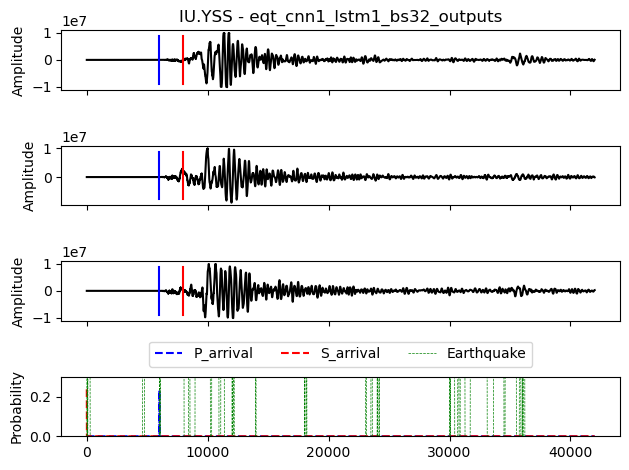

In [155]:
stats = test_stream[0].stats
plot_stream(data_, p_pred_eqt, s_pred_eqt, eq_pred_eqt, 
            is_test=True, pick_thres=.2, eq_thres=.5, hide_eq=False, 
            title=f'{stats.network}.{stats.station} - {selected_model}', 
            tr=test_stream[0])

### LSTM

In [161]:
selected_model = 'model_bs32_lr0.001'
model_path = f'../../lstm_models/{selected_model}/final_model.h5'

model_lstm = tf.keras.models.load_model(model_path)
print(model_lstm.summary())

TIMESTEPS = 6000

batch = []
for i in range(data.shape[0]//6000):
    batch.append(data[i*TIMESTEPS:(i+1)*TIMESTEPS])
batch = np.array(batch)
data_ = data[:batch[:,:,0].flatten().shape[0]]

eq_pred, p_pred, s_pred = model_lstm.predict(batch)
eq_pred_lstm = np.squeeze(eq_pred, axis=2).flatten()
p_pred_lstm = np.squeeze(p_pred, axis=2).flatten()
s_pred_lstm = np.squeeze(s_pred, axis=2).flatten()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 6000, 3)]    0           []                               
                                                                                                  
 conv1d_5 (Conv1D)              (None, 6000, 32)     224         ['input_2[0][0]']                
                                                                                                  
 max_pooling1d_5 (MaxPooling1D)  (None, 3000, 32)    0           ['conv1d_5[0][0]']               
                                                                                                  
 conv1d_6 (Conv1D)              (None, 3000, 32)     2080        ['max_pooling1d_5[0][0]']        
                                                                                            

In [163]:
model_lstm.evaluate(np.expand_dims(np.array(dset), axis=0), [np.array([label_p]), np.array([label_s]), np.array([label_eq])])

1/1 [==============================] - 5s 5s/step - loss: 2.7575 - detector_loss: 0.6103 - picker_S_loss: 0.0020 - picker_P_loss: 2.1452


[2.7575199604034424,
 0.6103337407112122,
 0.00195396039634943,
 2.1452322006225586]

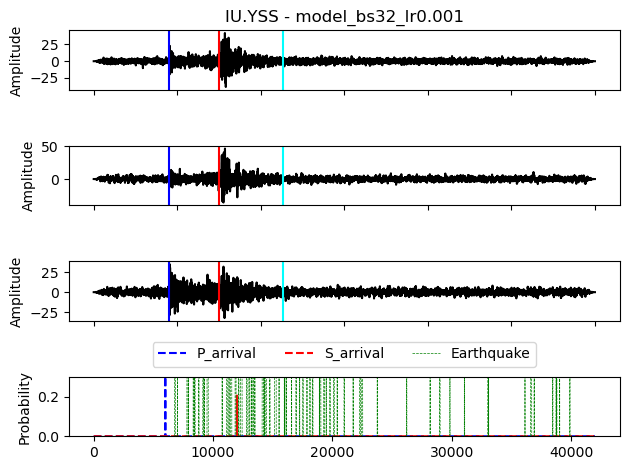

In [162]:
stats = test_stream[0].stats
plot_stream(dset, p_pred_lstm, s_pred_lstm, eq_pred_lstm, is_test=True, pick_thres=.2, eq_thres=.6, hide_eq=False, title=f'{stats.network}.{stats.station} - {selected_model}', tr=test_stream[0])

### Multi-Station Testing

In [52]:
import time
def get_model_pick(st, model, pick_thres=.2):
    data = []
    for tr in st:
        data.append(tr.data)

    data = np.array(data).T
    
    TIMESTEPS = 6000

    batch = []
    for i in range(data.shape[0]//TIMESTEPS):
        batch.append(data[i*TIMESTEPS:(i+1)*TIMESTEPS])
    batch = np.array(batch)
    data_ = data[:batch[:,:,0].flatten().shape[0]]

    start_time = time.time()
    eq_pred, p_pred, s_pred = model.predict(batch)
    elapsed_time = time.time() - start_time

    eq_pred_ = np.squeeze(eq_pred, axis=2).flatten()
    p_pred_ = np.squeeze(p_pred, axis=2).flatten()
    s_pred_ = np.squeeze(s_pred, axis=2).flatten()

    p_p,s_p = p_pred_.copy(), s_pred_.copy()
    # if model.name == 'model_1':
    p_ = (p_p>pick_thres).cumsum().cumsum() == 1
    p_p[~p_] = 0
    s_ = (s_p>pick_thres).cumsum().cumsum() == 1
    s_p[~s_] = 0

    return p_p, s_p, elapsed_time

In [165]:
df_

,Net,Station,Sampling Rate
0,II,ERM,20
1,IU,MAJO,20
2,G,INU,20
3,PS,INU,20
4,IU,YSS,20
5,PS,OGS,20
6,CB,CN2,100
7,CB,SNY,100
8,CB,HEH,100
9,CB,DL2,100


1/1 [==============================] - 0s 268ms/step
EQT:  [6000, 11997] 19.999984741210938
1/1 [==============================] - 0s 188ms/step
LSTM:  [5998, 11998] 19.999984741210938
1/1 [==============================] - 0s 204ms/step
EQT:  [6000, 12001] 20.0
1/1 [==============================] - 0s 83ms/step
LSTM:  [5998, 11998] 20.0
1/1 [==============================] - 0s 156ms/step
EQT:  [6000, 0] 20.0
1/1 [==============================] - 0s 71ms/step
LSTM:  [5998, 11996] 20.0
1/1 [==============================] - 0s 144ms/step
EQT:  [6000, 0] 20.0
1/1 [==============================] - 0s 53ms/step
LSTM:  [5998, 11998] 20.0
1/1 [==============================] - 0s 125ms/step
EQT:  [6000, 0] 20.0
1/1 [==============================] - 0s 51ms/step
LSTM:  [5998, 17998] 20.0
2/2 [==============================] - 0s 108ms/step
EQT:  [30000, 1] 100.0
2/2 [==============================] - 0s 48ms/step
LSTM:  [5998, 53998] 100.0
2/2 [==============================] - 0s 95ms/s

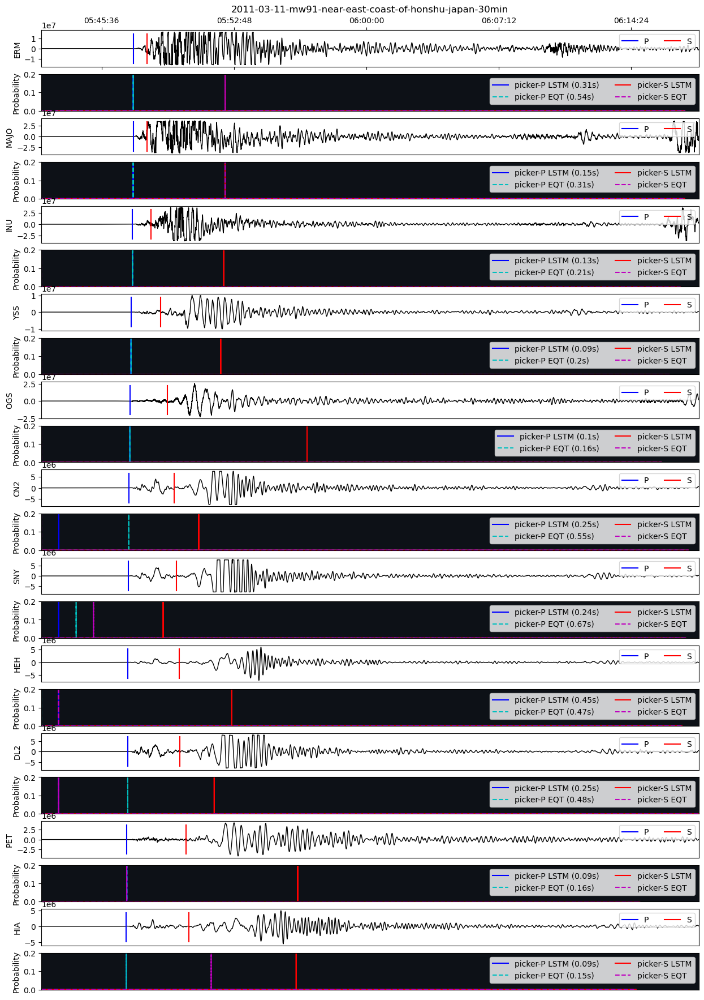

In [166]:
stz = st.select(component='Z').copy()
# stz.resample(100)
nt = stz.count()
# nt = 2
for mod in ['LSTM', 'EQT']:
    df_meta[f'Source Distance {mod}'] = [None for _ in range(len(df_meta))] 

df_ = df_meta[['Net','Station', 'Sampling Rate']]
for i in ['lstm', 'eqt']:
    df_[f'{i}_runtime'] = None
    for j in ['p', 's']:
        df_[f'{i}_is_{j}_valid'] = False
        
stz.sort(['endtime'])
fig, ax = plt.subplots(nt*2,1, figsize=(15, nt*2))
ax[0].set_title(name)
ax[0].tick_params(axis='x', labeltop=True, labelbottom=False, top=True)
for i in range(nt):
    tr = stz[i]
    
    x = tr.times('matplotlib')
    md = df_meta[df_meta['Station']==tr.stats.station]
    pa, sa = md['P Arrival'].values[0], md['S Arrival'].values[0]
    sr = tr.stats.sampling_rate
    pa, sa = int(pa*sr/md['Sampling Rate'].values[0]), int(sa*sr/md['Sampling Rate'].values[0])

    stp = st.select(station=tr.stats.station).copy()
    # stp.resample(100)
    p_eqt = get_model_pick(stp, model_eqt, pick_thres=.2)
    pa_eqt, sa_eqt = p_eqt[0].nonzero()[0][0], p_eqt[1].nonzero()[0][0]
    print('EQT: ',[p_eqt[0].nonzero()[0][0], p_eqt[1].nonzero()[0][0]], sr)
    
    p_lstm = get_model_pick(stp, model_lstm, pick_thres=.2)
    pa_lstm, sa_lstm = p_lstm[0].nonzero()[0][0], p_lstm[1].nonzero()[0][0]
    print('LSTM: ',[p_lstm[0].nonzero()[0][0], p_lstm[1].nonzero()[0][0]], sr)

    ax[i*2].plot(x, tr.data, 'k', lw=1)
    ax[i*2].axvline(x[pa], ymin=.1, ymax=.9, c='b', label='P')
    ax[i*2].axvline(x[sa], ymin=.1, ymax=.9, c='r', label='S')

    np_ = len(p_eqt[0]) 
    ax[i*2+1].plot(x[:np_], p_lstm[0], 'b', label=f'picker-P LSTM ({np.round(p_lstm[2],2)}s)')
    ax[i*2+1].plot(x[:np_], p_eqt[0], 'c--', label=f'picker-P EQT ({np.round(p_eqt[2],2)}s)')

    ax[i*2+1].plot(x[:np_], p_lstm[1], 'r', label=f'picker-S LSTM')
    ax[i*2+1].plot(x[:np_], p_eqt[1], 'm--', label=f'picker-S EQT')

    xt = tr.times('utcdatetime')
    dps = xt[sa] - xt[pa]
    dist = distance_model.predict(poly.fit_transform([[(dps/60)]]))[0]
    df_meta.loc[md.index, 'Source Distance'] = dist

    # save picking distance for each model
    tolerance = sr*2
    df_.loc[md.index, 'eqt_runtime'] = p_eqt[2]
    if ((sa_eqt-pa_eqt) > 0 and pa_eqt < pa+tolerance and pa_eqt > pa-tolerance):
        dps_eqt = xt[sa_eqt] - xt[pa_eqt]
        dist_eqt = distance_model.predict(poly.fit_transform([[(dps_eqt/60)]]))[0]
        df_meta.loc[md.index, 'Source Distance EQT'] = dist_eqt
        df_.loc[md.index, 'eqt_is_p_valid'] = True

    if (sa_eqt < sa+tolerance and sa_eqt > sa-tolerance):
        df_.loc[md.index, 'eqt_is_s_valid'] = True
    
    df_.loc[md.index, 'lstm_runtime'] = p_lstm[2]
    if ((sa_lstm-pa_lstm) > 0 and pa_lstm < pa+tolerance and pa_lstm > pa-tolerance):
        dps_lstm = xt[sa_lstm] - xt[pa_lstm]
        dist_lstm = distance_model.predict(poly.fit_transform([[(dps_lstm/60)]]))[0]
        df_meta.loc[md.index, 'Source Distance LSTM'] = dist_lstm
        df_.loc[md.index, 'lstm_is_p_valid'] = True
    
    if (sa_lstm < sa+tolerance and sa_lstm > sa-tolerance):
        df_.loc[md.index, 'lstm_is_s_valid'] = True
    
    ax[i*2].set_ylabel(f'{tr.stats.station}')
    ax[i*2+1].set_ylabel(f'Probability')
    ax[i*2].set_xlim([x[0], x[-1]])
    ax[i*2+1].set_xlim([x[0], x[-1]])
    ax[i*2+1].set_ylim([0,.2])
    ax[i*2+1].set_facecolor('#0d1117')
    ax[i*2].xaxis.set_major_formatter(mdates.DateFormatter('%H:%M:%S'))
    if i>0:
        ax[i*2].set_xticks([])
    ax[i*2+1].set_xticks([])
    ax[i*2].legend(loc='upper right', ncol=2)
    ax[i*2+1].legend(loc='upper right', ncol=2)

# fig.autofmt_xdate()
plt.show()

In [167]:
# for i in range(3,7):
#     plt.plot(df_.index, df_.iloc[:,i:i+1], label=df_.columns[i])
# plt.xticks(range(len(df_)), df_['Station'])
# plt.legend()
# plt.show()

df_

,Net,Station,Sampling Rate,lstm_runtime,lstm_is_p_valid,lstm_is_s_valid,eqt_runtime,eqt_is_p_valid,eqt_is_s_valid
0,II,ERM,20,0.314578,True,False,0.544385,True,False
1,IU,MAJO,20,0.150059,True,False,0.308963,True,False
2,G,INU,20,0.134045,True,False,0.210764,False,False
3,PS,INU,20,0.134045,True,False,0.210764,False,False
4,IU,YSS,20,0.093271,True,False,0.195983,False,False
5,PS,OGS,20,0.100674,True,False,0.164133,False,False
6,CB,CN2,100,0.24513,False,False,0.548582,False,False
7,CB,SNY,100,0.242018,False,False,0.665097,False,False
8,CB,HEH,100,0.450377,False,False,0.468149,False,False
9,CB,DL2,100,0.247295,False,False,0.47627,False,False


In [55]:
df_meta

,Station,Source,Net,Latitude,Longitude,Distance,Azimuth,Elevation,Station Name,P Arrival,S Arrival,Sampling Rate,Source Distance,Source Distance EQT,Source Distance LSTM
0,ERM,IRISDMC,II,42.015000,143.157200,3.752637,7.504429,40.0,"Erimo, Hokkaido Island, Japan",6000,6900,20,5.098705,30.698174,30.72052
1,MAJO,IRISDMC,IU,36.545670,138.204060,3.832722,-115.856675,405.0,"Matsushiro, Japan",6000,6920,20,5.165363,30.720486,30.720486
2,INU,RESIF,G,35.350000,137.029000,5.275407,-122.277124,132.0,"Inuyama, Japan",6000,7220,20,6.12999,None,30.705588
3,INU,IRISDMC,PS,35.348200,137.028500,5.276786,-122.290468,132.3,"Inuyama, Japan",6000,7220,20,6.12999,None,30.705588
4,YSS,IRISDMC,IU,46.958700,142.760400,8.664537,1.188902,150.0,"Yuzhno Sakhalinsk, Russia",6000,7960,20,8.463251,None,30.720486
5,OGS,IRISDMC,PS,27.057000,142.203000,11.242023,-178.652313,20.0,"Chichijima, Bonin Islands, Japan",6000,8520,20,10.436731,None,80.696519
6,CN2,IRISDMC,CB,43.480000,125.260002,13.991757,-62.792018,223.0,"Changchun,Jilin Province",30000,45501,100,12.833448,None,None
7,SNY,IRISDMC,CB,41.827801,123.578003,14.871195,-70.292310,54.0,"Shenyang,Liaoning Province",30000,46501,100,13.756337,None,None
8,HEH,IRISDMC,CB,50.252998,127.410004,16.053142,-37.004601,165.0,"Heihe,Heilongjiang Province",30000,47801,100,15.033358,None,None
9,DL2,IRISDMC,CB,38.905998,121.627998,16.285905,-81.328249,65.0,"Dalian,Liaoning Province",30000,48101,100,15.340481,None,None


### Hypocenter Calculation

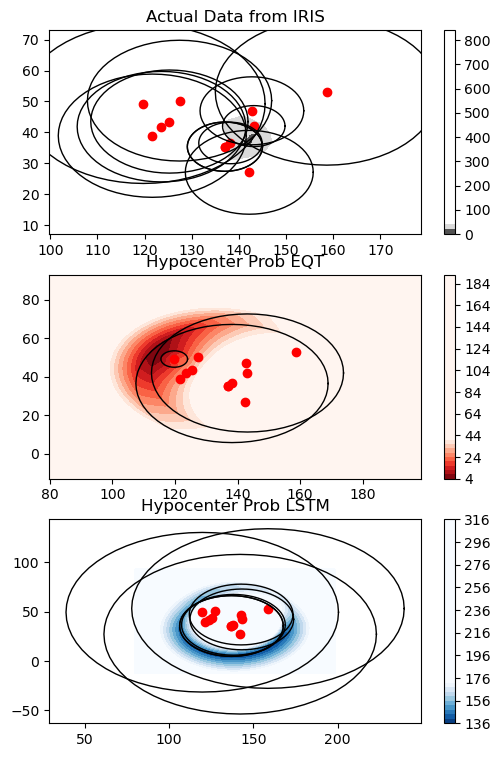

<Figure size 640x480 with 0 Axes>

In [62]:
from shapely import Point, Polygon, MultiPolygon
from matplotlib.colors import ListedColormap
import geojsoncontour

coords = np.array([(m['Latitude'], m['Longitude']) for m in metadata])

max_ = coords.max(axis=0)+40
min_ = coords.min(axis=0)-40

grid_lat = np.linspace(min_[0], max_[0], 100)
grid_lon = np.linspace(min_[1], max_[1], 100)

xv, yv = np.meshgrid(grid_lon,grid_lat)
ev_prob = np.zeros_like(xv)
ev_prob_lstm = np.zeros_like(xv)
ev_prob_eqt = np.zeros_like(xv)

fig, ax = plt.subplots(3, figsize=(6,9))
circles = [
    Point(row['Longitude'], row['Latitude'])
        .buffer(row['Source Distance']*1.3) for i,row in df_meta.iterrows()
]

circles_lstm = [
    (Point(row['Longitude'], row['Latitude']).buffer(row['Source Distance LSTM']*1) 
    if row['Source Distance LSTM'] else None) 
    for i,row in df_meta.iterrows()
    ]

circles_eqt = [
    (Point(row['Longitude'], row['Latitude']).buffer(row['Source Distance EQT']*1) 
    if row['Source Distance EQT'] else None) 
    for i,row in df_meta.iterrows()
    ]

for idx, row in df_meta.iterrows():
    sta_coord = np.array([row['Longitude'], row['Latitude']])
    circle = circles[idx]
    circle_lstm = circles_lstm[idx]
    circle_eqt = circles_eqt[idx]

    for i,(xx,yy) in enumerate(zip(xv,yv)):
        for j,x in enumerate(xx):
            grid_coord = np.array([x,yy[0]])
            point = Point(*grid_coord)
            # n = np.count_nonzero([c.contains(point) for c in circles])
            dist = circle.exterior.distance(point)
            ev_prob[i,j] += dist

            if circle_lstm:
                dist_lstm = circle_lstm.exterior.distance(point)
                ev_prob_lstm[i,j] += dist_lstm
            
            if circle_eqt:
                dist_eqt = circle_eqt.exterior.distance(point)
                ev_prob_eqt[i,j] += dist_eqt
                # ax[2].plot(*circle_lstm.exterior.xy, 'k', lw=1)

    ax[0].plot(*circle.exterior.xy, 'k', lw=1)
    if circle_eqt:
        ax[1].plot(*circle_eqt.exterior.xy, 'k', lw=1)

    if circle_lstm:
        ax[2].plot(*circle_lstm.exterior.xy, 'k', lw=1)

contour = ax[0].contourf(xv, yv, ev_prob, 50, vmax=40, cmap='Greys_r')
ax[0].set_title('Actual Data from IRIS')

vmax = (ev_prob_eqt.max() - ev_prob_eqt.min())*.2+ev_prob_eqt.min()
contour_lstm = ax[1].contourf(xv, yv, ev_prob_eqt, 50, vmax=vmax, cmap='Reds_r')
ax[1].set_title('Hypocenter Prob EQT')

vmax = (ev_prob_lstm.max() - ev_prob_lstm.min())*.2+ev_prob_lstm.min()
contour_eqt = ax[2].contourf(xv, yv, ev_prob_lstm, 50, vmax=vmax, cmap='Blues_r')
ax[2].set_title('Hypocenter Prob LSTM')

for i in range(3):
    ax[i].scatter(coords[:,1], coords[:,0], c='r')

ax[0].set_xlim(min_[1]+20, max_[1]-20)
ax[0].set_ylim(min_[0]+20, max_[0]-20)

cbar = fig.colorbar(contour)
cbar = fig.colorbar(contour_lstm)
cbar = fig.colorbar(contour_eqt)
plt.show()
plt.tight_layout()

In [57]:
geojsons = []
for ct in [contour, contour_lstm, contour_eqt]:
    geojson = geojsoncontour.contourf_to_geojson(
        contourf=ct,
        ndigits=3
    )

    geojson = json.loads(geojson)
    for i,feat in enumerate(geojson['features']):
        feat['id']=i+1
        geojson['features'][i] = feat

    geojson = json.dumps(geojson)
    geojsons.append(geojson)


In [58]:
SOURCE_DISTANCE_SHOW = True 
SOURCE_PROBABILITY_SHOW = True

im, jm = np.unravel_index(np.argmax(ev_prob), ev_prob.shape)

center = coords.mean(axis=0)
eq = (38.2963, 142.498, 19.7)

map = folium.Map(location=center, zoom_start=6)
folium.TileLayer('stamenterrain').add_to(map)

# Create a DivIcon object with the star icon as its HTML
eq_icon = folium.features.DivIcon(
    html='<i class="fa fa-star" style="color:red"></i>'
    )

folium.Marker(location=eq[:2], icon=eq_icon, tooltip='Earthquake').add_to(map)

for i, m in df_meta.iterrows():
    sta_center = [m['Latitude'], m['Longitude']]
    sta_icon = folium.features.DivIcon(
        html='<i class="fa fa-square fa-xl" style="color:blue"></i>'
        )
    if SOURCE_DISTANCE_SHOW:
        folium.Circle(
            location= sta_center,
            popup=f'Source Distance {m["Station"]}',
            fill_color='blue',
            color='black',
            weight=1,
            fill_opacity=.0,
            radius=m['Source Distance']*111139 
        ).add_to(map)

    if SOURCE_PROBABILITY_SHOW:
        for gjs in geojsons:
            folium.GeoJson(
                gjs,
                style_function= lambda feature: {
                    'fillColor':feature['properties']['fill'],
                    'fillOpacity':(2-feature['id'])/20, 'weight':0
                    }
                ).add_to(map)

    folium.Marker(
        location = sta_center, 
        icon=sta_icon,
        tooltip=f'{m["Net"]}.{m["Station"]} | {m["Station Name"]}'
    ).add_to(map)
    
map

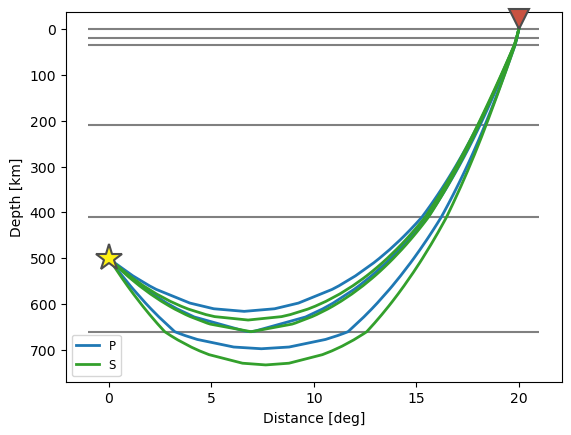

<Axes: xlabel='Distance [deg]', ylabel='Depth [km]'>

In [196]:
from obspy.taup import TauPyModel

model = TauPyModel(model='iasp91')
arrivals = model.get_ray_paths(500, 20, phase_list=['P', 'S'])
arrivals.plot_rays(plot_type='cartesian', phase_list=['P', 'S'],
                   plot_all=False, legend=True)